In [94]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.colors as mcolors
import seaborn as sns
sns.set_theme(font_scale=1.5, style = 'whitegrid', context= 'notebook')
import scipy.stats as stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import os
import plotly.express as px
import plotly.graph_objects as go
from scipy.optimize import curve_fit
from itertools import product
import dash
from dash import dcc, html, Input, Output
import scipy as sp
#from pybaselines import Baseline

#oadeji01
os.chdir('c:\\Users\\oadeji01\\OneDrive - Tufts\\Bunmi - NavehLab-01\\Raman_Bunmi\\20250609\\fitted1')#\\20250609_fitted

In [95]:
df = pd.read_csv('20250609.csv')#.iloc[:, 1:]
#df2 = pd.read_csv('c:\\Users\\oadeji01\\OneDrive - Tufts\\Bunmi - NavehLab-01\\Raman_Bunmi\\20250609\\20250609xx.csv')
#df2.columns =  df.columns

df.insert(0, 'exp', ['20250609']*len(df))
#df2.insert(0, 'exp', ['20250609']*len(df2))


#df = pd.concat([df, df2], axis=0).reset_index(drop=True)

In [96]:
df.head()

,exp,sample,trt_time,orient,spectra_num,752.673,753.817,754.96,756.103,757.245,...,1769.39,1770.26,1771.13,1772,1772.86,1773.73,1774.6,1775.46,1776.33,1777.19
0,20250609,Ctrl,20mins,Orth,1,37.9091,58.5620,67.9172,76.6241,83.7002,...,-2.450680,-1.987730,-0.953308,0.896881,3.11850,5.407040,7.526460,9.095520,7.81628,5.73096
1,20250609,Ctrl,20mins,Orth,2,66.8147,75.7830,84.0009,91.4624,98.1934,...,1.007780,1.758090,2.682220,3.712830,4.80676,6.115480,7.499360,9.035370,10.43790,11.99620
2,20250609,Ctrl,20mins,Orth,3,55.1526,54.0251,56.0063,57.7856,63.7314,...,-2.309570,-0.991272,-0.806519,-1.666930,-3.08429,-2.159480,-1.713930,-0.271179,1.11298,1.53979
3,20250609,Ctrl,20mins,Orth,4,57.8174,69.1449,79.1172,90.2723,99.9918,...,1.244480,-0.641479,-2.026250,-3.422240,-4.29776,-4.050630,-0.620697,-1.240780,-1.92834,-4.41141
4,20250609,Ctrl,20mins,Orth,5,54.0070,57.9308,65.4418,73.8916,83.7990,...,0.749023,1.045840,1.564270,1.782530,1.26898,0.345215,-1.089600,-2.985170,-5.38593,-8.34619


In [104]:
smoothed_list = []
for x in range(len(df.iloc[:, 5:])):
    smoothed_list.append(sp.signal.savgol_filter(x= df.iloc[x, 5:], window_length=15, polyorder=3))

smoothed_df = pd.DataFrame(smoothed_list, columns=df.iloc[:, 5:].columns)
smoothed_df = pd.concat([df.iloc[:, :5], smoothed_df], axis=1)

In [98]:
smoothed_df.to_csv('20250609_smoothed.csv')

In [105]:
meta_cols = ['exp', 'sample', 'trt_time', 'orient', 'spectra_num']
spectral_start_col = 4
#wavenumbers = smoothed_df.columns.to_numpy(float)
spectral_cols = smoothed_df.iloc[:, 5:-1].columns#.difference(['exp', 'sample', 'trt_time', 'orient', 'combo'])
wavenumbers = np.array([float(col) for col in spectral_cols])

# ------------------------
# Create combo labels
# ------------------------
def combo_label(row):
    return f"{row['exp']}|{row['sample']}|{row['trt_time']}|{row['orient']}|{row['spectra_num']}"

smoothed_df['combo'] = smoothed_df[meta_cols].apply(combo_label, axis=1)
unique_combos = smoothed_df['combo'].unique()

# ------------------------
# Initialize Dash App
# ------------------------
app = dash.Dash(__name__)

app.layout = html.Div([
    html.H2("Spectral Comparison Tool (Group A vs Group B)"),
    html.Div([
        html.Label("Select Group A"),
        dcc.Dropdown(id='dropdown-a', options=[{'label': c, 'value': c} for c in unique_combos],
                     value=unique_combos[0])
    ], style={'width': '45%', 'display': 'inline-block'}),

    html.Div([
        html.Label("Select Group B"),
        dcc.Dropdown(id='dropdown-b', options=[{'label': c, 'value': c} for c in unique_combos],
                     value=unique_combos[1])
    ], style={'width': '45%', 'display': 'inline-block', 'marginLeft': '5%'}),

    dcc.Graph(id='spectra-plot', style={"height": "700px"})
])

# ------------------------
# Callback to update plot
# ------------------------
@app.callback(
    Output('spectra-plot', 'figure'),
    Input('dropdown-a', 'value'),
    Input('dropdown-b', 'value')
)
def update_plot(combo_a, combo_b):
    fig = go.Figure()

    offset_b = 500

    # Group A
    subset_a = smoothed_df[smoothed_df['combo'] == combo_a]
    for _, row in subset_a.iterrows():
        y = row.iloc[spectral_start_col:-1].values.astype(float)
        fig.add_trace(go.Scatter(
            x=wavenumbers,
            y=y,
            mode='lines',
            line=dict(color='blue'),
            name=f"A: {combo_a}"
        ))

    # Group B (with offset)
    subset_b = smoothed_df[smoothed_df['combo'] == combo_b]
    for _, row in subset_b.iterrows():
        y = row.iloc[spectral_start_col:-1].values.astype(float) + offset_b
        fig.add_trace(go.Scatter(
            x=wavenumbers,
            y=y,
            mode='lines',
            line=dict(color='red'),
            name=f"B: {combo_b} (+{offset_b})"
        ))

    fig.update_layout(
        title=f"Group A: {combo_a} vs Group B: {combo_b}",
        xaxis_title="Wavenumber (cm⁻¹)",
        yaxis_title="Intensity (a.u.)",
        height=600,
        width=1100,
        template="plotly_white",
        xaxis = dict(
        tickmode = 'array', 
        tickvals = np.arange(800, 1750, 50),
        range = [800, 1750]
    )
    
    )
    return fig

# ------------------------
# Run the App
# ------------------------
if __name__ == '__main__':
    app.run(debug=True)


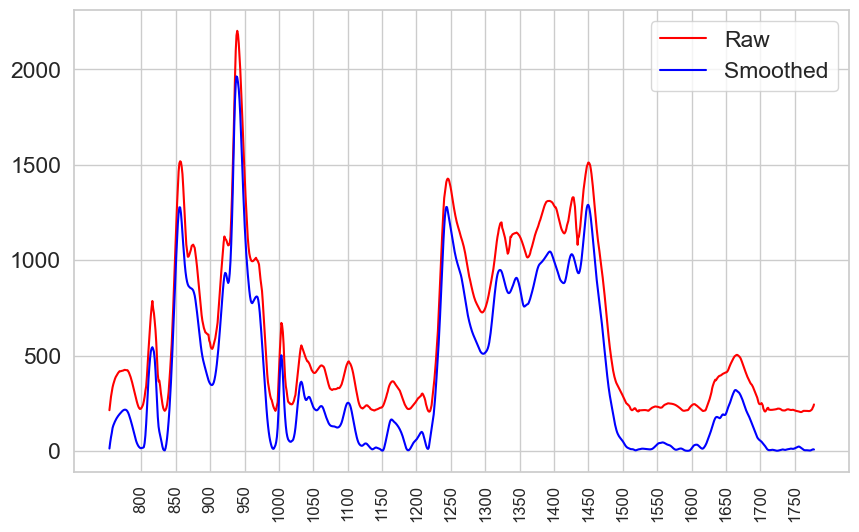

In [ ]:
plt.figure(figsize = (10, 6))
sns.lineplot(
    x = smoothed_df[(smoothed_df['sample'] == 'Ctrl') & (smoothed_df['trt_time'] == '24h') & (smoothed_df['orient'] == 'Orth') & (smoothed_df['spectra_num'] == 6)].iloc[:, 5:-1].columns.to_numpy(float), 
    y = smoothed_df[(smoothed_df['sample'] == 'Trt') & (smoothed_df['trt_time'] == '20mins') & (smoothed_df['orient'] == 'Orth') & (smoothed_df['spectra_num'] == 6)].iloc[:, 5:-1].values[0] + 200,
    color = 'red',
    label = 'Raw'
);
sns.lineplot(
    x = smoothed_df[(smoothed_df['sample'] == 'Ctrl') & (smoothed_df['trt_time'] == '20mins') & (smoothed_df['orient'] == 'Orth') & (smoothed_df['spectra_num'] == 6)].iloc[:, 5:-1].columns.to_numpy(float), 
    y = smoothed_x[0],
    color = 'blue',
    label = 'Smoothed'
);

plt.xticks(ticks=np.arange(800, 1800, 50), fontsize =  12, rotation = 90, ha = 'center');

In [70]:
def baseline_correct_spectrum(y, method='arpls', lam=1e5):
    baseline_fitter = Baseline()
    # pybaselines returns (baseline, params)
    baseline, _ = getattr(baseline_fitter, method)(y, lam=lam)
    return baseline

def baseline_correct_dataframe(df, method='arpls', lam=1e5):
    corrected = []
    for idx, row in df.iterrows():
        y = np.asarray(row.values, dtype=np.float64)
        baseline = baseline_correct_spectrum(y, method=method, lam=lam)
        corrected.append(y - baseline)
    return pd.DataFrame(corrected, columns=df.columns, index=df.index)


In [71]:
corrected_df = baseline_correct_dataframe(df = df.iloc[:, 4:], method = 'arpls', lam = 1e5)

In [73]:
df.columns[600:700]

Index(['1384.42', '1385.4', '1386.37', '1387.35', '1388.33', '1389.3',
       '1390.28', '1391.25', '1392.23', '1393.2', '1394.18', '1395.15',
       '1396.12', '1397.1', '1398.07', '1399.04', '1400.02', '1400.99',
       '1401.96', '1402.93', '1403.91', '1404.88', '1405.85', '1406.82',
       '1407.79', '1408.76', '1409.73', '1410.7', '1411.67', '1412.64',
       '1413.61', '1414.58', '1415.55', '1416.51', '1417.48', '1418.45',
       '1419.42', '1420.38', '1421.35', '1422.32', '1423.29', '1424.25',
       '1425.22', '1426.18', '1427.15', '1428.11', '1429.08', '1430.04',
       '1431.01', '1431.97', '1432.93', '1433.9', '1434.86', '1435.82',
       '1436.79', '1437.75', '1438.71', '1439.67', '1440.63', '1441.6',
       '1442.56', '1443.52', '1444.48', '1445.44', '1446.4', '1447.36',
       '1448.32', '1449.28', '1450.24', '1451.19', '1452.15', '1453.11',
       '1454.07', '1455.03', '1455.98', '1456.94', '1457.9', '1458.85',
       '1459.81', '1460.77', '1461.72', '1462.68', '1463.63'

In [72]:
base_df = pd.concat([df.iloc[:, :3], corrected_df], axis=1)
base_df.to_csv('20250429-0501.csv', index = False)

In [87]:
df#.iloc[:, 4:]

,exp,Unnamed: 0,sample,trt_time,orient,752.673,753.817,754.96,756.103,757.245,...,1769.39,1770.26,1771.13,1772,1772.86,1773.73,1774.6,1775.46,1776.33,1777.19
0,20250609,0,Ctrl,20mins,Orth,20.135100,26.775000,34.650500,43.324100,52.080000,...,6.33526,5.81454,5.31166,4.83020,4.37220,3.93975,3.53344,3.15475,2.80343,2.48005
1,20250609,1,Ctrl,20mins,Orth,20.984000,28.009200,36.107500,44.811100,53.448900,...,2.83330,3.43919,4.68539,6.52050,8.71086,10.83640,12.39390,12.95720,12.35320,10.72970
2,20250609,2,Ctrl,20mins,Orth,15.713000,20.535500,26.208900,32.671400,39.783700,...,6.77675,7.19366,7.60113,7.99417,8.36856,8.71968,9.04386,9.33650,9.59437,9.81366
3,20250609,3,Ctrl,20mins,Orth,21.460000,23.165300,25.098300,27.293100,29.784900,...,7.92459,7.58894,7.27984,6.99502,6.73190,6.48850,6.26251,6.05263,5.85700,5.67463
4,20250609,4,Ctrl,20mins,Orth,32.671100,35.894400,39.578600,43.782200,48.553100,...,8.46996,7.65848,6.99847,6.46199,6.02253,5.65910,5.35454,5.09669,4.87545,4.68382
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180,20250609,180,Trt,60mins,Orth,19.462000,23.893300,28.753300,33.917500,39.214900,...,16.62150,15.43090,14.27590,13.16320,12.09600,11.07840,10.11110,9.19769,8.33768,7.53306
181,20250609,181,Trt,60mins,Para,12.563300,13.349400,13.984000,14.441900,14.704900,...,20.10860,19.49810,18.81650,18.07350,17.27820,16.44080,15.56980,14.67630,13.76830,12.85660
182,20250609,182,Trt,60mins,Para,0.000682,0.001352,0.002615,0.004933,0.009074,...,13.61400,14.13750,14.02400,13.18990,11.70970,9.78792,7.68892,5.67353,3.92850,2.55380
183,20250609,183,Trt,60mins,Para,4.612630,6.664990,8.854310,10.817000,12.156500,...,11.92670,11.55570,11.16790,10.76600,10.35230,9.92948,9.49935,9.06499,8.62800,8.19139


In [90]:
norm = df.iloc[:, 5:].div(df['1455.6'], axis=0)#dt.iloc[:, 5:].sum(axis=1)
dt_norm = pd.concat([df.iloc[:, :5], norm], axis=1)
#dt_norm = dt_norm.drop(dt_norm.index[113:119])

In [95]:
# Difference of Treated and Final Treated
df_mean = dt_norm.groupby(['exp', 'sample', 'trt_time', 'orient']).mean().reset_index()

diff = []
diff_final = []
for orient in ['Para', 'Orth']:
    for x in ['2mins','20mins','40mins', '60mins', '24h']:#
        dif = df_mean[(df_mean['orient'] == orient) & (df_mean['trt_time']==x)].iloc[1, 4:] - df_mean[(df_mean['orient'] == orient) & (df_mean['trt_time']==x)].iloc[0, 4:]
        #dif_24h = df_mean[(df_mean['orient'] == orient) & (df_mean['trt_time'].isin([x, f'{x}24h']))].iloc[2, 3:]-df_mean[(df_mean['orient'] == orient) & (df_mean['trt_time'].isin([x, f'{x}24h']))].iloc[0, 3:]
        diff.append({'trt_time': x, 'orient': orient, 'd': dif.values})
        #diff_final.append({'trt_time': x, 'orient': orient, 'd': dif_24h.values})


diff_df = pd.DataFrame(diff)
#diff_dff = pd.DataFrame(diff_final)

df_diff = pd.concat([diff_df.iloc[:, :2], diff_df['d'].apply(pd.Series)], axis = 1)
#dff_diff = pd.concat([diff_dff.iloc[:, :2], diff_dff['d'].apply(pd.Series)], axis = 1)

df_diff.columns = ['trt_time','orient'] + df_mean.iloc[:, 4:].columns.tolist()
#dff_diff.columns = ['trt_time','orient'] + df_mean.iloc[:, 3:].columns.tolist()

df_diff.insert(0, 'sample', ['diff']*len(df_diff))
#dff_diff.insert(0, 'sample', ['diff_final']*len(df_diff))
#pd.DataFrame(diff)

sub_dff =pd.concat([df_diff])#, dff_diff
sub_dff.head()

,sample,trt_time,orient,752.673,753.817,754.96,756.103,757.245,758.388,759.53,...,1769.39,1770.26,1771.13,1772,1772.86,1773.73,1774.6,1775.46,1776.33,1777.19
0,diff,2mins,Para,2.959591,0.015568,0.016327,0.013619,0.006585,-0.003544,-0.013578,...,0.002523,0.001812,0.000950,-0.000028,-0.001087,-0.002188,-0.003295,-0.004370,-0.005381,-0.006300
1,diff,20mins,Para,3.085969,0.014061,0.023214,0.033070,0.041835,0.050706,0.060424,...,0.016474,0.019262,0.023625,0.027934,0.033797,0.036945,0.034842,0.036166,0.035937,0.035017
2,diff,40mins,Para,0.514848,0.021322,0.016443,0.010478,0.004435,-0.000687,-0.004228,...,0.071781,0.071339,0.069513,0.066221,0.061664,0.056274,0.050568,0.045041,0.040026,0.035695
3,diff,60mins,Para,-5.714876,-0.015344,-0.025887,-0.038031,-0.050809,-0.063335,-0.074912,...,0.062428,0.062067,0.061304,0.059673,0.056912,0.053178,0.048913,0.044611,0.040620,0.037121
4,diff,24h,Para,3.963192,0.033771,0.037155,0.042612,0.051251,0.061122,0.066834,...,0.041836,0.040167,0.038486,0.036839,0.035257,0.033767,0.032383,0.031117,0.029968,0.028934


In [96]:
df_diff = pd.concat([dt_norm, sub_dff], axis=0)
df_sam = df_diff.melt(id_vars=['exp', 'sample', 'trt_time', 'orient'])#.drop(['sample'], axis=1)
#[dt['sample'] == 'Micetail_Ribo0.5_pre']
df_sam[["variable", "value"]] = df_sam[["variable", "value"]].astype('float64')
df_sam.head()

,exp,sample,trt_time,orient,variable,value
0,20250609,Ctrl,20mins,Orth,752.673,20.1351
1,20250609,Ctrl,20mins,Orth,752.673,20.9840
2,20250609,Ctrl,20mins,Orth,752.673,15.7130
3,20250609,Ctrl,20mins,Orth,752.673,21.4600
4,20250609,Ctrl,20mins,Orth,752.673,32.6711


In [109]:
# create offsets for each treatment group, exept the pbs
group_offsets = {
    '2mins': 0.0,
    #'Trt': 1.5,
    '20mins': 2,
    '40mins': 4.0,
    '60mins': 6.0,
    '24h':8,
    '2min24h': 0.5,
    #'Trt': 1.5,
    '20min24h': 2.5,
    '40min24h': 4.5,
    '60min24h': 6.5,
    
    
}
#'22mins': 5.7,
#    '27mins': 6.7,
 #   '32mins': 7.7
#make a copy of the dataframe
df_sam_spectra = df_sam.copy()
# add the defined offset value for each group
for group, offset in group_offsets.items():
    df_sam_spectra.loc[df_sam_spectra['trt_time']== group, 'value'] += offset

In [105]:
df_sam['trt_time'].unique()

array(['20mins', '24h', '2mins', '40mins', '60mins', '20min24h',
       '2min24h', '40min24h', '60min24h'], dtype=object)

In [10]:
df_sam_spectra['sample'].unique()

array(['Ctrl', 'Trt_final', 'Trt', 'diff'], dtype=object)

In [30]:
for i in range(len(dt_norm)):
    fig = px.line(
        #df_sam_spectra[(df_sam_spectra['sample']=='Trt') & (df_sam_spectra['orient'] =='Orth')],# ,'Trt'
        x = dt_norm.iloc[:, 3:].columns,
        y=dt_norm.iloc[i, 3:], 
                #color="trt_time",
                #symbol =  'orient',
                #category_orders={'trt_time': ['2mins','20mins','40mins', '60mins']}
                )
    fig.update_traces(line=dict(width=1))
    fig.update_layout(
        width=1600,  # Sets the width of the plot to 800 pixels
        height=900, # Sets the height of the plot to 600 pixels
    )
    fig.show()

KeyboardInterrupt: 

In [119]:

fig = px.line(
    df_sam_spectra[(df_sam_spectra['sample']=='Ctrl') & (df_sam_spectra['orient'] =='Para')],# ,'Trt'
    x="variable", y="value", 
              color="trt_time",
              #symbol =  'orient',
              category_orders={'trt_time': ['2mins', '2min24h','20mins','20min24h','40mins', '40min24h','60mins', '60min24h', '24h']}
              )
fig.update_traces(line=dict(width=1))
fig.update_layout(
    width=1200,  # Sets the width of the plot to 800 pixels
    height=900, # Sets the height of the plot to 600 pixels
    xaxis_range = [790, 1700],
    yaxis_range = [-1, 10]
)
fig.show()

In [121]:
fig.write_html("Parallel_Ctrl.html")

In [8]:
df

,exp,sample,trt_time,orient,752.673,753.817,754.96,756.103,757.245,758.388,...,1769.39,1770.26,1771.13,1772,1772.86,1773.73,1774.6,1775.46,1776.33,1777.19
0,20250609,Ctrl,20mins,Orth,20.135100,26.775000,34.650500,43.324100,52.080000,60.07780,...,6.33526,5.81454,5.31166,4.83020,4.37220,3.93975,3.53344,3.15475,2.80343,2.48005
1,20250609,Ctrl,20mins,Orth,20.984000,28.009200,36.107500,44.811100,53.448900,61.28700,...,2.83330,3.43919,4.68539,6.52050,8.71086,10.83640,12.39390,12.95720,12.35320,10.72970
2,20250609,Ctrl,20mins,Orth,15.713000,20.535500,26.208900,32.671400,39.783700,47.34980,...,6.77675,7.19366,7.60113,7.99417,8.36856,8.71968,9.04386,9.33650,9.59437,9.81366
3,20250609,Ctrl,20mins,Orth,21.460000,23.165300,25.098300,27.293100,29.784900,32.61540,...,7.92459,7.58894,7.27984,6.99502,6.73190,6.48850,6.26251,6.05263,5.85700,5.67463
4,20250609,Ctrl,20mins,Orth,32.671100,35.894400,39.578600,43.782200,48.553100,53.93010,...,8.46996,7.65848,6.99847,6.46199,6.02253,5.65910,5.35454,5.09669,4.87545,4.68382
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180,20250609,Trt,60mins,Orth,19.462000,23.893300,28.753300,33.917500,39.214900,44.44930,...,16.62150,15.43090,14.27590,13.16320,12.09600,11.07840,10.11110,9.19769,8.33768,7.53306
181,20250609,Trt,60mins,Para,12.563300,13.349400,13.984000,14.441900,14.704900,14.76450,...,20.10860,19.49810,18.81650,18.07350,17.27820,16.44080,15.56980,14.67630,13.76830,12.85660
182,20250609,Trt,60mins,Para,0.000682,0.001352,0.002615,0.004933,0.009074,0.01629,...,13.61400,14.13750,14.02400,13.18990,11.70970,9.78792,7.68892,5.67353,3.92850,2.55380
183,20250609,Trt,60mins,Para,4.612630,6.664990,8.854310,10.817000,12.156500,12.58020,...,11.92670,11.55570,11.16790,10.76600,10.35230,9.92948,9.49935,9.06499,8.62800,8.19139


In [23]:
df[(df['sample'] == 'Ctrl') & (df['trt_time'] == '20mins') & (df['orient'] == 'Orth')]#.iloc[:, 4:]

,exp,sample,trt_time,orient,752.673,753.817,754.96,756.103,757.245,758.388,...,1769.39,1770.26,1771.13,1772,1772.86,1773.73,1774.6,1775.46,1776.33,1777.19
0,20250609,Ctrl,20mins,Orth,20.1351,26.7750,34.6505,43.3241,52.0800,60.0778,...,6.33526,5.81454,5.31166,4.83020,4.37220,3.93975,3.53344,3.15475,2.80343,2.48005
1,20250609,Ctrl,20mins,Orth,20.9840,28.0092,36.1075,44.8111,53.4489,61.2870,...,2.83330,3.43919,4.68539,6.52050,8.71086,10.83640,12.39390,12.95720,12.35320,10.72970
2,20250609,Ctrl,20mins,Orth,15.7130,20.5355,26.2089,32.6714,39.7837,47.3498,...,6.77675,7.19366,7.60113,7.99417,8.36856,8.71968,9.04386,9.33650,9.59437,9.81366
3,20250609,Ctrl,20mins,Orth,21.4600,23.1653,25.0983,27.2931,29.7849,32.6154,...,7.92459,7.58894,7.27984,6.99502,6.73190,6.48850,6.26251,6.05263,5.85700,5.67463
4,20250609,Ctrl,20mins,Orth,32.6711,35.8944,39.5786,43.7822,48.5531,53.9301,...,8.46996,7.65848,6.99847,6.46199,6.02253,5.65910,5.35454,5.09669,4.87545,4.68382
5,20250609,Ctrl,20mins,Orth,18.4693,21.3608,25.4078,31.3033,40.0325,52.0819,...,15.56220,16.15090,16.43700,16.09960,15.09340,13.68600,12.20950,10.87400,9.74768,8.82692
6,20250609,Ctrl,20mins,Orth,23.7015,28.1148,32.9722,38.2314,43.8243,49.6730,...,16.12320,15.83260,15.38680,14.79930,14.08680,13.27030,12.37060,11.41280,10.41890,9.41329


In [184]:
def gaussian(x, a, x0, sigma):
    return a * np.exp(-(x - x0)**2 / (2 * sigma**2))

# -----------------------------
# Peak Fitting Function
# -----------------------------
def fit_peak(x, y, center_guess, window=30):
    # Crop data around the peak
    mask = (x > center_guess - window) & (x < center_guess + window)
    x_crop = x[mask]
    y_crop = y[mask]

    if len(x_crop) < 5:
        return None
    
    try:
        # Initial guess: amplitude, center, width
        p0 = [np.max(y_crop), center_guess, 5]
        popt, _ = curve_fit(gaussian, x_crop, y_crop, p0=p0)
        return popt  # a, x0, sigma
    except RuntimeError:
        return None

In [185]:
o_put = []
for x in df['sample'].unique():
    for y in df['trt_time'].unique():
        for z in df['orient'].unique():
            # -----------------------------
            # Simulate or Load Spectra
            # -----------------------------

            dx = df[(df['sample'] == x) & (df['trt_time'] == y) & (df['orient'] == z)]
            xx = dx.iloc[:, 4:].columns.astype('float64').to_numpy()
            spectra = dx.iloc[:, 4:].to_numpy()
            fit_window = 40
            true_peaks = [815, 855, 870, 920, 940,  
                        1003, 1243, 1270,  1635, 1664]  # Expected peak regions (center positions)
            #762, 783, 1425,#1166,1395, 970,1096,1034,1053,  1062,  1128,  
            #1205, 1223,1322, 1343, 1374, 
                       #  1439, 1450, 1488,

            # -----------------------------
            # Fit All Spectra
            # -----------------------------
            results = {pk: [] for pk in true_peaks}
            details = [f'{x}_{y}_{z}']
            

            for yy in spectra:
                for pk in true_peaks:
                    fit = fit_peak(xx, yy, pk, window = fit_window)
                    if fit is not None:
                        results[pk].append(fit[1])  # x0 (peak position)
                    else:
                        results[pk].append(np.nan)

            # -----------------------------
            # Output Mean Peak Positions
            # -----------------------------
            df_peak = pd.DataFrame(results)
            df_peak.insert(0, 'details', [details]*len(df_peak))
            o_put.append(df_peak)
            #mean_positions = df_peak.mean()
            #position_std = df_peak.std()
            '''print("\n📊 Mean Peak Positions:")
            print(mean_positions)
            print(position_std)'''



In [186]:
peak_df = pd.concat(o_put)
peak_df = pd.concat([pd.DataFrame(peak_df['details'].to_list(), columns=['details']).reset_index(drop = True), peak_df.iloc[:, 1:].reset_index(drop = True)], axis=1)

In [187]:
deets = peak_df['details'].str.split('_', expand = True)
deets.columns = ['sample', 'trt_time', 'orient']
deets
peak_df = pd.concat([deets, peak_df.iloc[:, 1:]], axis=1)

In [188]:
pk_df_long = peak_df.melt(id_vars=['sample', 'trt_time', 'orient'],
             )
pk_df_long['variable'] = pk_df_long['variable'].astype('int')

(1.5, 6.5)

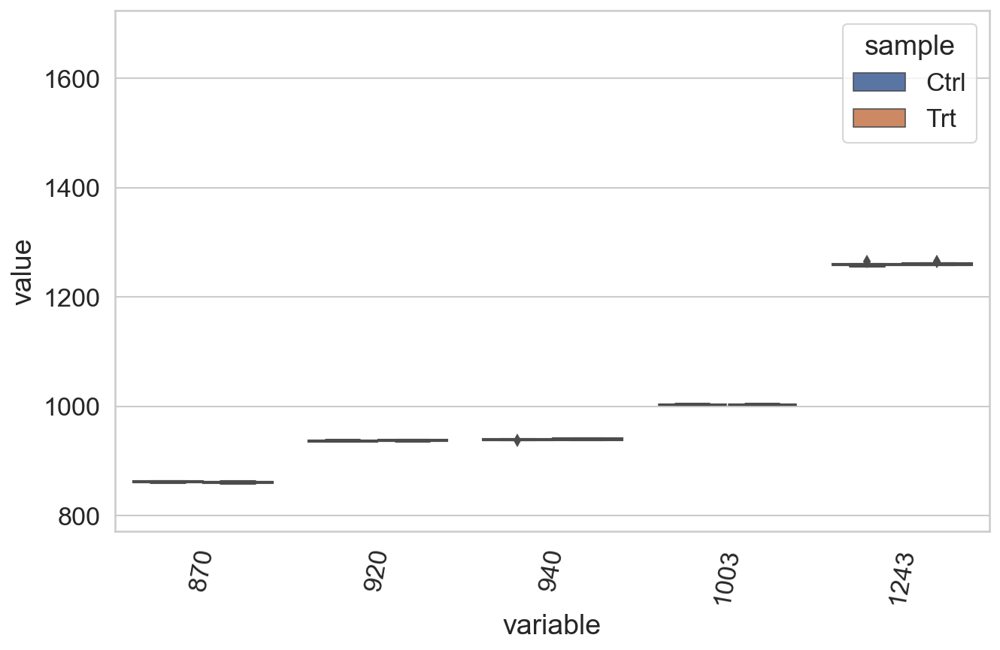

In [190]:
plt.figure(figsize=(10, 6), dpi = 150)
sns.boxplot(
    data = pk_df_long[(pk_df_long['trt_time']=='60mins') & (pk_df_long['orient'] == 'Para')], #& (pk_df_long['value'] <= 1000)
    x = 'variable',
    y = 'value',
    hue = 'sample'
)
plt.xticks(rotation = 80, ha = 'center');
#plt.ylim([750, 1000])
plt.xlim([1.5, 6.5])
#plt.yscale('log')

In [195]:
peak_df[peak_df['trt_time'].str.contains('40min')].groupby(['orient', 'sample', 'trt_time', ]).mean().T

orient           Orth                                   Para               \
sample           Ctrl          Trt                      Ctrl          Trt   
trt_time       40mins     40min24h       40mins       40mins     40min24h   
815        816.804381   816.563346   816.609774   816.278348   816.144289   
855        861.622695   862.275208   861.803544   861.688279   862.411929   
870        861.889024   862.590991   862.086362   862.036525   862.926651   
920        940.642847   941.067073   940.650390   937.645060   938.092201   
940        943.570676   944.258918   944.054538   939.688746   940.583653   
1003      1004.041548  1004.648354  1004.942264  1004.099780  1004.112569   
1243      1249.306558  1249.654966  1249.036502  1253.512056  1250.376210   
1270      1248.111049  1248.423722  1247.603316  1250.234213  1247.851685   
1635      1658.297104  1665.796565  1659.704448  1666.972275  1666.644914   
1664      1655.738611  1657.310572  1655.366517  1659.475308  1658.461803   

orient                 
sample                 
trt_time       40mins  
815        814.843293  
855        861.797246  
870        864.757332  
920        958.414650  
940        941.741933  
1003      1004.188243  
1243      1253.831503  
1270      1248.904201  
1635      1660.778876  
1664      1655.230780

In [196]:
peak_df[peak_df['trt_time'].str.contains('40min')].groupby(['orient', 'sample', 'trt_time', ]).std().T

orient        Orth                           Para                     
sample        Ctrl        Trt                Ctrl       Trt           
trt_time    40mins   40min24h    40mins    40mins  40min24h     40mins
815       0.831561   0.718519  0.370262  0.856690  0.972179   0.587263
855       0.417529   0.530467  0.626488  0.479184  0.785558   2.555183
870       0.428207   0.532434  0.640017  0.440770  0.748126   2.633467
920       0.251293   0.354286  0.394522  0.757044  0.853696  38.445362
940       0.267790   0.661286  0.724757  1.180381  0.943471   1.740181
1003      0.225123   0.212941  0.408837  0.609662  0.621698   0.489209
1243      0.829802   1.024121  1.921785  4.047067  4.092104   2.550683
1270      0.759544   1.164644  1.354776  5.165078  3.988400   6.259209
1635      1.251744  10.750723  5.233817  5.083828  5.099413   5.802407
1664      1.651004   3.429258  2.315953  1.546017  1.624706   2.289529


📊 Mean Peak Positions:
peak_762      772.694497
peak_783             NaN
peak_815      816.329893
peak_855      862.034270
peak_870      862.215752
peak_920      939.798578
peak_940      942.328306
peak_970      929.305070
peak_1003    1003.490011
peak_1034    1043.539497
peak_1053    1048.780986
peak_1062    1040.550634
peak_1096    1055.812412
peak_1128            NaN
peak_1166    1176.534303
peak_1205    1243.894419
peak_1223    1246.458419
peak_1243    1248.703954
peak_1270    1247.220978
peak_1322    1344.800068
peak_1343    1350.266217
peak_1374    1345.057431
peak_1395    1461.251359
peak_1425    1895.793348
peak_1439    1442.778238
peak_1450    1444.797587
peak_1488    1443.897562
peak_1635    1659.988910
peak_1664    1656.130357
dtype: float64
peak_762       1.876759
peak_783            NaN
peak_815       0.574886
peak_855       0.578647
peak_870       0.599265
peak_920       2.056230
peak_940       2.631395
peak_970       4.356921
peak_1003           NaN
peak_1034     17.133

C:\Users\oadeji01\AppData\Local\Temp\ipykernel_19376\83694754.py:81: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\oadeji01\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


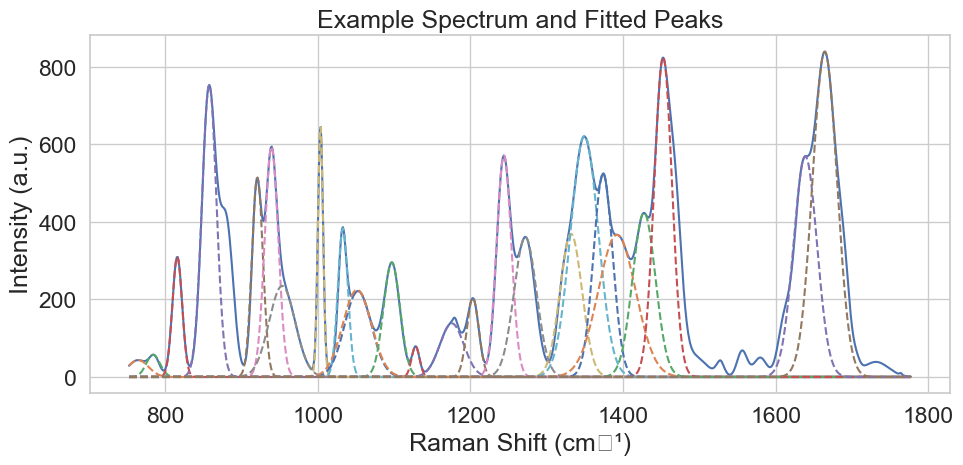

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import pandas as pd

# -----------------------------
# Define a Gaussian function
# -----------------------------
def gaussian(x, a, x0, sigma):
    return a * np.exp(-(x - x0)**2 / (2 * sigma**2))

# -----------------------------
# Simulate or Load Spectra
# -----------------------------

x = df.iloc[:, 4:].columns.astype('float64').to_numpy()
spectra = df[(df['sample'] == 'Ctrl') & (df['trt_time'] == '2mins') & (df['orient'] == 'Orth')].iloc[:, 4:].to_numpy()
fit_window = 40
true_peaks = [762, 783, 815, 855, 870, 920, 940, 970, 
              1003, 1034, 1053,  1062, 1096, 1128, 1166, 
              1205, 1223, 1243, 1270, 1322, 1343, 1374, 
              1395, 1425, 1439, 1450, 1488, 1635, 1664]  # Expected peak regions (center positions)


# -----------------------------
# Peak Fitting Function
# -----------------------------
def fit_peak(x, y, center_guess, window=5):
    # Crop data around the peak
    mask = (x > center_guess - window) & (x < center_guess + window)
    x_crop = x[mask]
    y_crop = y[mask]

    if len(x_crop) < 5:
        return None
    
    try:
        # Initial guess: amplitude, center, width
        p0 = [np.max(y_crop), center_guess, 10]
        popt, _ = curve_fit(gaussian, x_crop, y_crop, p0=p0)
        return popt  # a, x0, sigma
    except RuntimeError:
        return None

# -----------------------------
# Fit All Spectra
# -----------------------------
results = {f"peak_{pk}": [] for pk in true_peaks}

for y in spectra:
    for pk in true_peaks:
        fit = fit_peak(x, y, pk, window = fit_window)
        if fit is not None:
            results[f"peak_{pk}"].append(fit[1])  # x0 (peak position)
        else:
            results[f"peak_{pk}"].append(np.nan)

# -----------------------------
# Output Mean Peak Positions
# -----------------------------
df_peak = pd.DataFrame(results)
mean_positions = df_peak.mean()
position_std = df_peak.std()
''print("\n📊 Mean Peak Positions:")
print(mean_positions)
print(position_std)''

peak_pos = pd.DataFrame(mean_positions, columns = ['mean'])
peak_pos.insert(1, 'std', position_std)


# -----------------------------
# Plot Example Fit
# -----------------------------
plt.figure(figsize=(10, 5))
y_example = spectra[0]
plt.plot(x, y_example, label='Spectrum')
for pk in true_peaks:
    fit = fit_peak(x, y_example, pk)
    if fit is not None:
        plt.plot(x, gaussian(x, *fit), '--', label=f'Fit near {pk} cm⁻¹')
plt.xlabel('Raman Shift (cm⁻¹)')
plt.ylabel('Intensity (a.u.)')
plt.title('Example Spectrum and Fitted Peaks')
#plt.legend()
plt.tight_layout()
plt.show()         
            






ValueError: x and y must have same first dimension, but have shapes (1,) and (1024,)

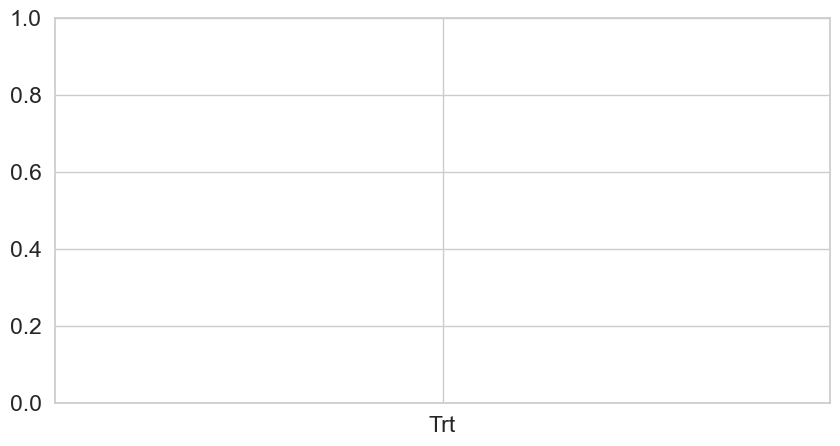

In [96]:
# -----------------------------
# Plot Example Fit
# -----------------------------
plt.figure(figsize=(10, 5))
y_example = spectra[0]
plt.plot(x, y_example, label='Spectrum')
for pk in true_peaks:
    fit = fit_peak(x, y_example, pk)
    if fit is not None:
        plt.plot(x, gaussian(x, *fit), '--', label=f'Fit near {pk} cm⁻¹')
plt.xlabel('Raman Shift (cm⁻¹)')
plt.ylabel('Intensity (a.u.)')
plt.title('Example Spectrum and Fitted Peaks')
#plt.legend()
plt.tight_layout()
plt.show()

In [12]:
# -----------------------------
# Export Mean Peak Positions to CSV
# -----------------------------
mean_positions.to_csv("mean_peak_positions.csv", header=["Mean Position (cm⁻¹)"])
position_std.to_csv("peak_position_std.csv")
#print("\n✅ Mean peak positions saved to 'mean_peak_positions.csv'")

In [19]:
peak_pos = pd.DataFrame(mean_positions, columns = ['mean'])
peak_pos.insert(1, 'std', position_std)


<ErrorbarContainer object of 3 artists>

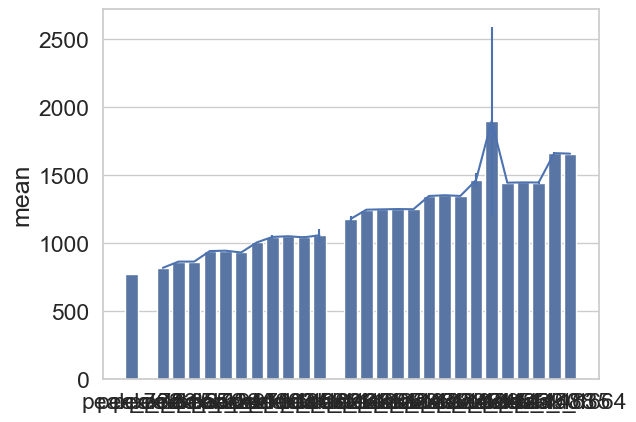

In [30]:
sns.barplot(
    data = peak_pos,
    x = peak_pos.index.to_numpy(),
    y = 'mean'
)
plt.errorbar(
    x = peak_pos.index.to_numpy(),
    y = peak_pos['mean'],
    yerr=peak_pos['std']
)

<Axes: ylabel='mean'>

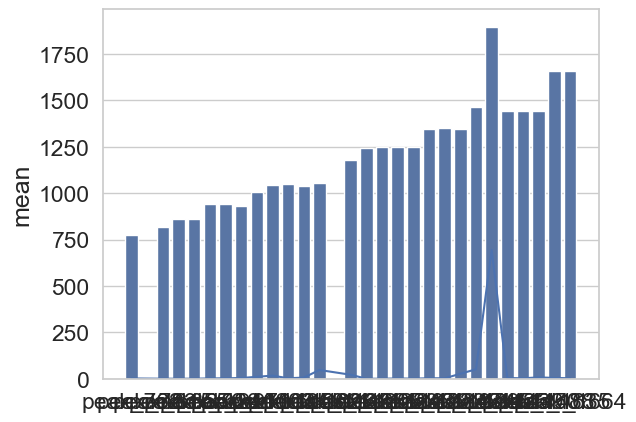

In [26]:
sns.barplot(
    data = peak_pos,
    x = peak_pos.index.to_numpy(),
    y = 'mean'
)
sns.lineplot(
    data = peak_pos,
    x = peak_pos.index.to_numpy(),
    y = 'std'
)

In [23]:
peak_pos#.index

,mean,std
peak_762,772.694497,1.876759
peak_783,NaN,NaN
peak_815,816.329893,0.574886
peak_855,862.034270,0.578647
peak_870,862.215752,0.599265
peak_920,939.798578,2.056230
peak_940,942.328306,2.631395
peak_970,929.305070,4.356921
peak_1003,1003.490011,NaN
peak_1034,1043.539497,17.133862
